<a href="https://colab.research.google.com/github/jorgeturriate/GANsForDataAugmentation/blob/main/MV_Project_JorgeTurriate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Machine Vision Project**

This project consist on two phases:



1.   Data Augmentation using Generative Adversarial Networks
2.   Neural Style Transfer



## **I. Data Augmentation using Generative Adversarial Networks**

This first part consist on the following steps:

* You are given the new dataset which is a collection of cows and horses.

* The first objective is to design a CNN which should be able to correctly classify them.
* The CNN performance could be improved by data augmentation. So the purpose of the second phase is to use GANs to synthesize more data.
*The generated data is them fed into the CNN, in the training stage, to improve the classifier discrimination power.

### **I.1. Cows and Horses Classifier**

The first step in this project is to nake a classifier to identify cows and horses from the given dataset.

#### Libraries
We are going to use **Pytorch** as a framework, so let's import the libraries.

In [ ]:
#PYTORCH
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
#import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from google.colab.patches import cv2_imshow
from google.colab import drive

#### Datasets

The next step is reading the dataset. We have a given dataset composed by two folder: **Train** and **Test**. Both folders contain 2 folders: **Cow** and **Horse**.
I uploaded these folders in my Google Drive account, so I can read those images in this notebook.

In [ ]:
drive.mount('/content/drive')
directory = '/content/drive/MyDrive/MachineVision/Newdata'
train_path = directory+'/Train'
test_path = directory+'/Test'

Mounted at /content/drive


To read those folders, we need to creade a **DataLoader** in Pytorch. We can create them by using the following Python code. It's important to mention that we are resizing our images to **64x64 resolution** because we are going to generate our images in the GAN part using this resolution. We also normalized the images to **[-1,+1]** because in the GAN part this normalization is important for our Generator's activation function. I performed a shuffle in both Train and Test Datasets to avoid any possibility of bias during training, to ensure randomness in batch selection, and for preventing the model from learning patterns based on the order of the data. The **batch size is set to 64**, this is possible thanks that we are running this notebook using GPU.

In [ ]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
batch_size = 64
transform= transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(64),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                               ])
train_data= dset.ImageFolder(root= train_path, transform=transform)
trainloader= torch.utils.data.DataLoader(train_data, shuffle=True, batch_size=batch_size)

test_data= dset.ImageFolder(root=test_path, transform=transform)
testloader= torch.utils.data.DataLoader(test_data, shuffle=True, batch_size=batch_size)
classes= os.listdir(train_path)
image_sample= train_data[0]


We can see how many elements our Train and Test datasets have by printing its length.

In [ ]:
print("The train dataset has {} elements".format(len(train_data)))
print("The test dataset has {} elements".format(len(test_data)))

The train dataset has 82 elements
The test dataset has 82 elements


Let's see the dimentions of our images after resizing them to **64x64** resolution.

In [ ]:
np.array(image_sample[0]).shape

(3, 64, 64)

And the classes recognized in our dataset:

In [ ]:
classes

['Cow', 'Horse']

#### Showing images

Let's output the images of one batch to show how our dataset looks like

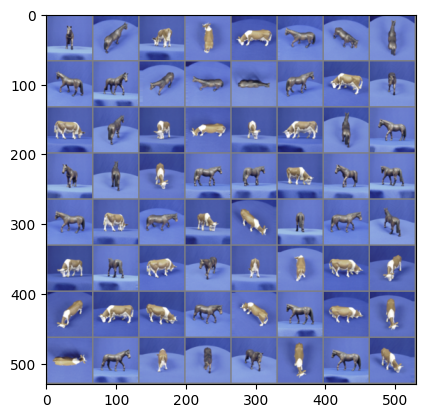

<built-in method size of Tensor object at 0x78f59d147100>
Horse Horse Cow   Cow   Cow   Horse Horse Horse Horse Horse Horse Horse Horse Horse Cow   Horse Cow   Horse Cow   Cow   Cow   Cow   Horse Horse Horse Horse Cow   Horse Horse Cow   Horse Horse Horse Cow   Horse Cow   Cow   Horse Horse Horse Cow   Horse Cow   Horse Cow   Cow   Cow   Cow   Cow   Cow   Cow   Horse Cow   Horse Cow   Cow   Cow   Horse Cow   Horse Horse Cow   Horse Cow  


In [ ]:
# functions to show an image
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()
# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)
# show image
imshow(vutils.make_grid(images))
print(images.size)
# print labels
print(' '.join(f'{classes[labels[j]]:5s}' for j in range(batch_size)))

#### Classifier model

Let's create our classifier model by creating the following class called **ClassifierModel** in our Pytorch framework. Our Classifier model has the following layers:
- Conv1: This is a 2D Convolutional Layer which takes the input image with (3x64x64) and then outputs a (32x64x64) image. The kernel size is (3x3) for all these convolutional layers in our model.
- Act1: This is the activation layer which uses a ReLU function and wraps the previous Conv1 layer.
- Drop1: This is a Dropout layer and it helps our model to prevent a possible overfitting by deactivating p=0.3 neurons.
- Conv2:This is the second 2D Convolutional Layer which takes the input image with (32x64x64) and then outputs a (64x64x64) image.
- Act2:This is the activation layer which uses a ReLU function and wraps the previous Conv2 layer.
- Pool2: This layer performs a 2D MaxPool with a kernel size of (2x2) which decreases the resolution of the image to (32x32), so we got an output image of (64x32x32)
- Conv3: This is the third 2D Convolutional Layer which takes the input image with (64x32x32) and then outputs a (64x32x32) image.
- Act3: This is the activation layer which uses a ReLU function and wraps the previous Conv3 layer.
- Pool3: This layer performs a 2D MaxPool with a kernel size of (2x2) which decreases the resolution of the image to (16x16), so we got an output image of (64x16x16)

- Flatten: This layer performs a Flatten operation. So the input image with (64x16x16) is transformed into a flatten image with 16384 elements.

- Fc4: This is a linear layer which takes the flattened image with 16384 elements and outputs 256 neurons.

- Act4: This is the activation layer which uses a ReLU function and wraps the previous fc4 layer.

- Drop4: This is a Dropout layer and it helps our model to prevent possible overfitting by deactivating p=0.5 neurons.

- Fc5: This is a the output layer which takes the information from the hidden layer with 256 neurons and outputs 2 neurons because we have two classes (Cow, Horse).

In [ ]:
#PYTORCH MODEL
class ClassifierModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=(3,3), stride=1, padding=1)
        self.act1 = nn.ReLU()
        self.drop1 = nn.Dropout(0.3)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=(3,3), stride=1, padding=1)
        self.act2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=(2, 2))

        self.conv3 = nn.Conv2d(64, 64, kernel_size=(3,3), stride=1, padding=1)
        self.act3 = nn.ReLU()
        self.pool3 = nn.MaxPool2d(kernel_size=(2, 2))

        self.flat = nn.Flatten()

        self.fc4 = nn.Linear(16384, 256)
        self.act4 = nn.ReLU()
        self.drop4 = nn.Dropout(0.5)

        self.fc5 = nn.Linear(256, 2)

    def forward(self, x):
        # input 3x64x64, output 32x64x64
        x = self.act1(self.conv1(x))
        x = self.drop1(x)
        # input 32x64x64, output 32x64x64
        x = self.act2(self.conv2(x))
        # input 32x64x64, output 32x32x32
        x = self.pool2(x)
        # input 32x32x32, output 64x32x32
        x = self.act3(self.conv3(x))
        # input 64x32x32, output 64x16x16
        x = self.pool3(x)
        # input 64x16x16, output 16384
        x = self.flat(x)
        # input 16384, output 256
        x = self.act4(self.fc4(x))
        x = self.drop4(x)
        # input 256, output 2
        x = self.fc5(x)
        return x


In [ ]:
model = ClassifierModel()
# Print the model
print(model)

ClassifierModel(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act1): ReLU()
  (drop1): Dropout(p=0.3, inplace=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act2): ReLU()
  (pool2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act3): ReLU()
  (pool3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (fc4): Linear(in_features=16384, out_features=256, bias=True)
  (act4): ReLU()
  (drop4): Dropout(p=0.5, inplace=False)
  (fc5): Linear(in_features=256, out_features=2, bias=True)
)


Let's create also our loss function and the optimizer to the perform the training. Since it's a Classification task, let's use a CrossEntropyLoss function. The optimizer chosen is an Adam optimizer with a learning rate of 0.001.

In [ ]:
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

#### Training
Let's perform the training, we will use **10 epochs**. I created 4 arrays to track the evolution of the losses and accuracies during the training and testing.

In [ ]:
n_epochs = 10
train_losses = []
test_losses = []
train_acc = []
test_acc = []
iters = 0
for epoch in range(n_epochs):
    acc_train = 0
    train_loss= 0
    count_train = 0
    for inputs, labels in trainloader:
        # forward, backward, and then weight update
        y_pred = model(inputs)
        acc_train += (torch.argmax(y_pred, 1) == labels).float().sum()
        count_train += len(labels)
        loss = loss_fn(y_pred, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss+=loss
        train_losses.append(loss.item())
        train_acc.append((torch.argmax(y_pred, 1) == labels).float().sum())
        iters+=1
    acc_train /= count_train
    train_loss /= count_train


    acc_test = 0
    test_loss= 0
    count_test = 0
    for inputs, labels in testloader:
        y_pred = model(inputs)
        acc_test += (torch.argmax(y_pred, 1) == labels).float().sum()
        count_test += len(labels)
        loss = loss_fn(y_pred, labels)
        test_loss+=loss
        test_losses.append(loss.item())
        test_acc.append((torch.argmax(y_pred, 1) == labels).float().sum())
    acc_test /= count_test
    test_loss /= count_test
    print("Epoch %d: train accuracy %.2f%% train loss %.2f%% test accuracy %.2f%% test loss %.2f%%" % (epoch, acc_train*100, train_loss*100, acc_test*100, test_loss*100))

Epoch 0: train accuracy 50.00% train loss 1.75% test accuracy 50.00% test loss 1.98%
Epoch 1: train accuracy 56.10% train loss 1.62% test accuracy 51.22% test loss 1.76%
Epoch 2: train accuracy 93.90% train loss 0.96% test accuracy 48.78% test loss 3.44%
Epoch 3: train accuracy 98.78% train loss 0.33% test accuracy 50.00% test loss 5.18%
Epoch 4: train accuracy 98.78% train loss 0.05% test accuracy 51.22% test loss 15.06%
Epoch 5: train accuracy 100.00% train loss 0.01% test accuracy 48.78% test loss 20.42%
Epoch 6: train accuracy 100.00% train loss 0.00% test accuracy 50.00% test loss 31.09%
Epoch 7: train accuracy 100.00% train loss 0.00% test accuracy 48.78% test loss 34.96%
Epoch 8: train accuracy 100.00% train loss 0.00% test accuracy 50.00% test loss 47.11%
Epoch 9: train accuracy 100.00% train loss 0.00% test accuracy 48.78% test loss 69.01%


After the training, we could see that our model is not working well. The Train accuracy reached 100% and the Test accuracy was mantained around 50% which clearly shows an overfitting case. I tried different network architectures to try to increase the Test accuracy, but I always had the same result and it happens because our Classifier just have 82 images in the Train Dataset which causes this overfitting behavior.

We could plot the evolution of the loss during the Training and Testing with the following plots.

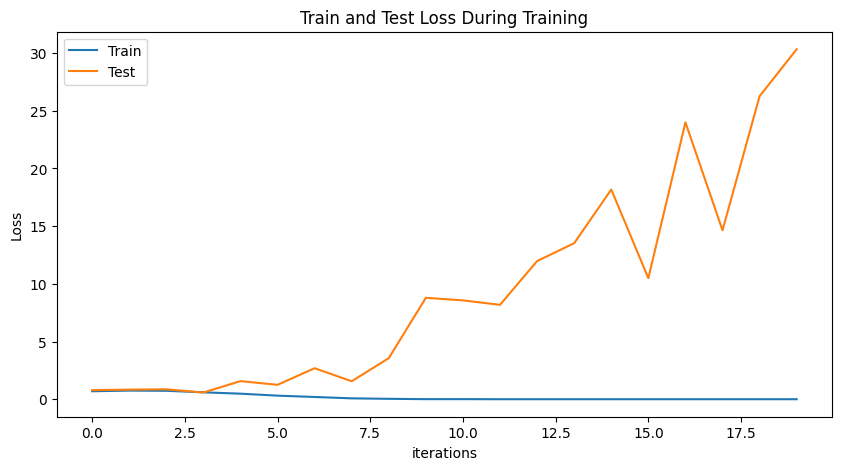

In [ ]:
#With 256x256 images
plt.figure(figsize=(10,5))
plt.title("Train and Test Loss During Training")
plt.plot(train_losses, label="Train")
plt.plot(test_losses, label="Test")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

As we could see in the previous plot, the loss for the Test dataset was always increasing while the Train dataset was decreasing until reached actually a 0 value.

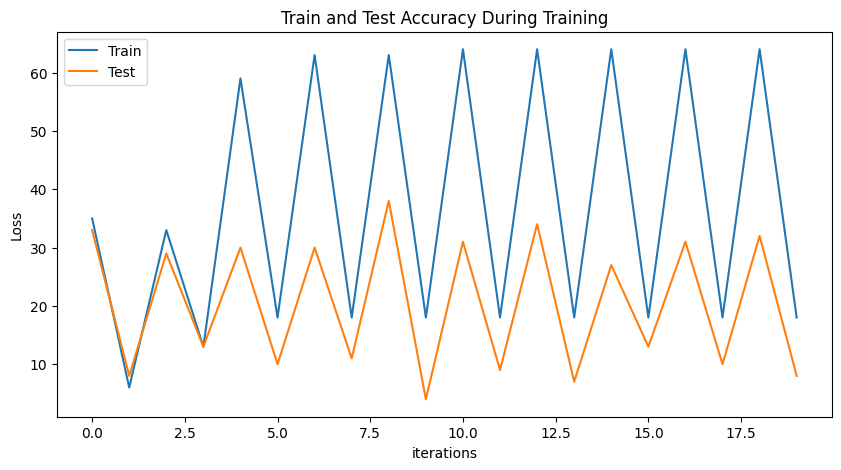

In [ ]:
#With 256x256 images
plt.figure(figsize=(10,5))
plt.title("Train and Test Accuracy During Training")
plt.plot(train_acc, label="Train")
plt.plot(test_acc, label="Test")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

The Accuracy plot shows that our Train Dataset was always increasing its values while the Test dataset remained at the same level.

#### Predicting some images
Let's show how badly our Classifier is performing the predictions. Let's use our Test dataset to show how it's performing.

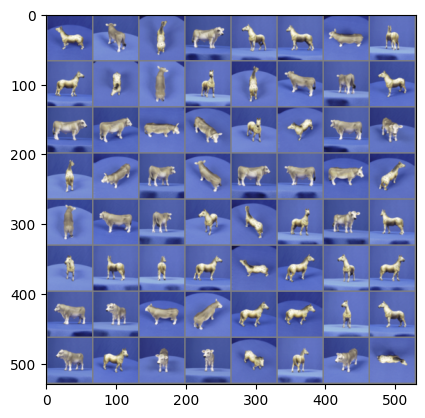

GroundTruth:  Horse Cow   Horse Cow  
Predicted:  Cow   Cow   Cow   Cow  


In [ ]:
from inspect import modulesbyfile
dataiter = iter(testloader)
images, labels = next(dataiter)
# print images
imshow(vutils.make_grid(images))
print('GroundTruth: ', ' '.join(f'{classes[labels[j]]:5s}' for j in range(4)))
outputs = model(images)
#print(outputs)
_, predicted = torch.max(outputs, 1)
print('Predicted: ', ' '.join(f'{classes[predicted[j]]:5s}'for j in range(4)))

As we could see we made 4 predictions and in all of them, I had the same result: "Cow", even though there were horses in the list.

#### Accuracy metrics and Confusion Matrix
Finally, before to create our GAN network, let's show some accuracy metrics and the confusion matrix for all the predictions.



In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Initialize lists to store predictions and labels
all_predictions = []
all_labels = []

# Iterate through the test dataset
for images, labels in testloader:
    # Perform prediction
    outputs = model(images)
    _, predicted = torch.max(outputs, 1)

    # Store predictions and labels
    all_predictions.extend(predicted.tolist())
    all_labels.extend(labels.tolist())

# Convert lists to tensors
all_predictions = torch.tensor(all_predictions)
all_labels = torch.tensor(all_labels)

# Compute classification report
print("Classification Report:")
print(classification_report(all_labels, all_predictions, target_names=classes))

Classification Report:
              precision    recall  f1-score   support

         Cow       0.49      0.98      0.66        41
       Horse       0.00      0.00      0.00        41

    accuracy                           0.49        82
   macro avg       0.25      0.49      0.33        82
weighted avg       0.25      0.49      0.33        82



In the Confusion Matrix, we could see that there were a lot of wrong predictions because our Clasifier considered most of the images as a Cow.

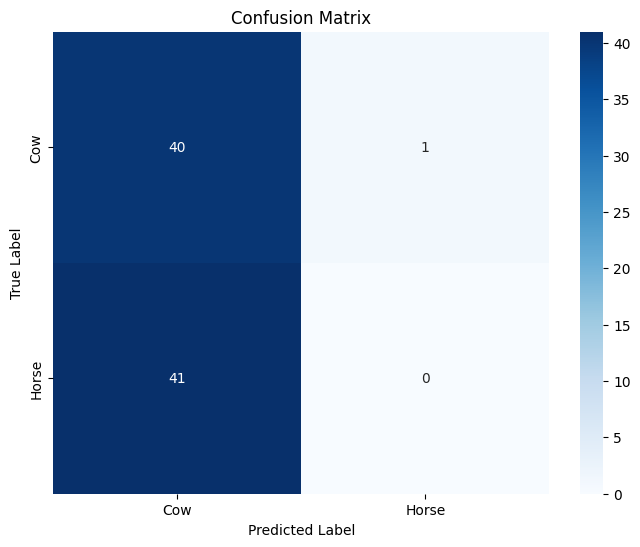

In [ ]:
# Compute confusion matrix
conf_matrix = confusion_matrix(all_labels, all_predictions)

# Visualize confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

### **I.2. Generative Adversarial Networks**

As we saw in the previous section, our classifier is not doing well, and this is because we have a small dataset, so let's try to generate more images to increase its accuracy. Therefore, the second step in this project is to perform a GAN to do a data augmentation and improve our classifier.

#### GAN Definition

The Generative Adversarial Networks consist of two Deep Learning Networks which are called **Generator** and **Discriminator**.
- The **Discriminator** network is a Binary Classifier which classifies the images as real or fake.
- The **Generator** network is trained to try to fool the Discriminator with fake images generated from a Latent Space.

Both networks are trained together, so the Generator is learning always with the performance that Discriminator did when it detected the fake images. Then, the Generator will try to generate better images. These networks are called "Adversarial" because both networks are always competing, so the generator is trying to improve itself and trying create better fake images while the discriminator to have a strong detection.

#### Conditional GAN
Traditional GAN networks are good, but not so suitable for this project. I tried at the beginning with a Traditional GAN, but I faced one problem which was that the generated images were unlabeled, so I had to try to classify them by myself to label them which is not good due the large number of images. Therefore, I decided to use another approach: **Conditional GAN**

Conditional GAN are a sub-type of GAN network in which the class label is provided also as an input for both Generator and Discriminator. This label conditions the output of the Generator, so it will generate an output image based on the latent space and this class label. Then, the Discriminator will try to distinguish between real and fake images as Traditional GAN, but considering also the class label provided, so in case the image provided is different from the class provided, it will say that the image is not good.


#### Setting the hyperparemeters
The most important thing when we create our GAN network is to set up the hyperparameters, because the better our model is well set up, the better images we will have.

*   **batch_size**: The batch size during training is set up to 32
* **image_size**: The images are resized to 64x64 pixels
*   **nc**: The number of channels in the training images, since our images have 3 colors (RGB), it's set up with 3.
* **nz** and **embedding_dim**: It's the size of the latent vector. It's set up to 256 because I want to generate more details in my generated image.
* **ngf**: Size of the feature maps in the generator. It's set up to 64.
* **ndf**: Size of the feature maps in the discriminator. It's set up to 64.
* **num_epochs**: Number of training epochs. It's set up to 700 to perform a good training.
* **lr**: Learning rate used in the optimizers. It's set up to 0.0002
* **n_classes**: This is the number of classes: Horse and Cow (2 classes)





In [ ]:
# Batch size during training
batch_size = 32

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
#image_size = 256
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 256
embedding_dim= 256

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 700

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1#1

#Defining the numer of classes (Horse and Cow)
n_classes=2

torch.use_deterministic_algorithms(False)

Then, we need to create a function to initialize the weights in our network.

In [ ]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

#### Loading our Dataset
Then, let's create a function to load again our train Dataset. In this step it's necessary to resize the images to 64x64, because our GAN performance will be better for low resolution images. We also normalize the dataset to be in range of [-1,1] which is important for our Generator because it uses a TanH activation function.

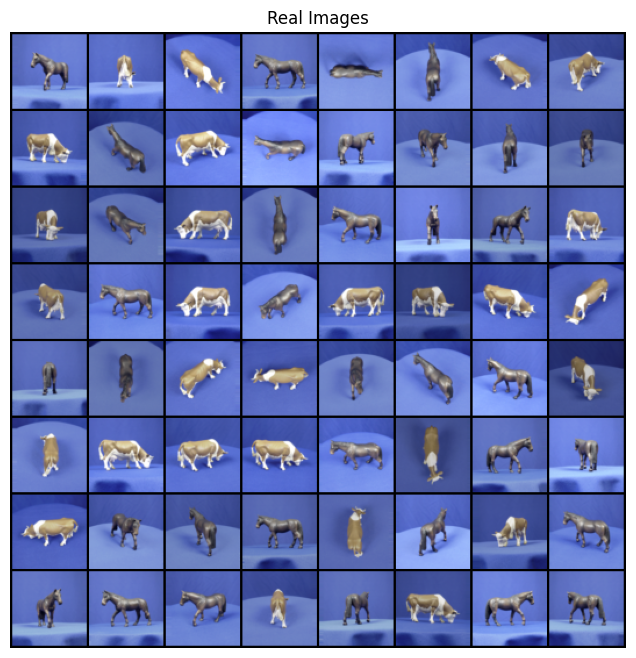

In [ ]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
transform= transforms.Compose([
                               transforms.RandomHorizontalFlip(), #Added
                               transforms.ColorJitter(brightness=0.2),
                               transforms.ToTensor(),
                               transforms.Resize(image_size),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                               ])
train_data= dset.ImageFolder(root= directory+'/Train', transform=transform)
trainloader= torch.utils.data.DataLoader(train_data, shuffle=True, batch_size=batch_size)

test_data= dset.ImageFolder(root=directory+'/Test', transform=transform)
testloader= torch.utils.data.DataLoader(test_data, shuffle=True, batch_size=batch_size)

#Combining both datasets
merged_dataset= torch.utils.data.ConcatDataset([train_data, test_data])

# Create the dataloader for the merged dataset
merged_loader= torch.utils.data.DataLoader(merged_dataset, shuffle=True, batch_size=batch_size)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(trainloader)) #merged_loader
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

#### Generator

Now, let's define our Generator for our Conditional GAN. This step is important because we are going to consider the class label as another input. So, our Generator consider two inputs: **the class label** and **the latent space** and it outputs a **generated image** with (3x64x64) dimension.
Therefore, the Generator network is defined in this way:

* **Label_Conditioned_Generator**: This is a Sequential layer which takes the class label as an input and it outputs a resized Linear Tensor with 16 elements. Inside this Sequential layer, there is an Embedding layer which embeds the Labels (2) into the Embedding dimension which was defined with 256. Then, the output of this layer is passed to a Linear layer which  takes these embedded classes inside the Latent dimension (256) and outputs 16 elements.
* **Latent**: This is a Sequential layer which takes the Latent space and outputs a Tensor with (512 x 4 x 4) containing this Latent space. Inside this layer there is a Linear layer which takes the Embedding dimension defined as (256) and outputs a Tensor (512 x 4 x 4), this Linear layer has a LeakyRelu activation function which generates the output for this Latent layer.
* **Model Layer**: This Sequential layer takes the Latent space concatenated with the label and performs some Upsamplings by using ConvTranspose2D layers, so the input which is a Tensor with (513 x 4 x 4) is converted into an image with (3x64x64) dimensions which belongs with the provided label. The activation function used is a Tanh which uses a range of [-1,+1], so that was the reason why we normalized the dataset using this range.


It's important to mention the structure of our ConvTranspose2D layers, because they are the main responsible in doing the upsampling. Therefore, they are using the following settings:
- **Kernel size**: They are using a kernel size of 4x4.
- **Strides**: These are the number of pixels where our kernel skips to do the Unconvolution. Since we are defining this quantity as **2**, the image size is duplicated at the end of the ConvTranspose2D layer,


In [ ]:
#Generator
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu

        self.label_conditioned_generator = nn.Sequential(nn.Embedding(n_classes, embedding_dim),
                                                         nn.Linear(embedding_dim, 16))


        self.latent = nn.Sequential(nn.Linear(embedding_dim, 4*4*ngf*8), #4*4*512
                                    nn.LeakyReLU(0.2, inplace=True))


        self.model =  nn.Sequential( # state size. ``(ngf*8 + 1) x 4 x 4``
            nn.ConvTranspose2d(513, ngf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*8, momentum=0.1,  eps=0.8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 8 x 8``
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1,bias=False),
            nn.BatchNorm2d(ngf*4, momentum=0.1,  eps=0.8),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 16 x 16``
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1,bias=False),
            nn.BatchNorm2d(ngf*2, momentum=0.1,  eps=0.8),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 32 x 32``
            nn.ConvTranspose2d(ngf*2, 3, 4, 2, 1, bias=False),
            nn.Tanh())

    def forward(self, inputs):
        noise_vector, label = inputs
        label_output = self.label_conditioned_generator(label)
        label_output = label_output.view(-1, 1, 4, 4)
        latent_output = self.latent(noise_vector)
        latent_output = latent_output.view(-1, 512,4,4)
        concat = torch.cat((latent_output, label_output), dim=1)
        image = self.model(concat)
        #print(image.size())
        return image

So, let's create our Generator and load its initial weights.

In [ ]:
# Create the Generator
generator= Generator(ngpu).to(device)

# Handle multi-GPU if desired
#if (device.type == 'cuda') and (ngpu > 1):
#    generator = nn.DataParallel(generator, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
generator.apply(weights_init)

# Print the model
print(generator)

Generator(
  (label_conditioned_generator): Sequential(
    (0): Embedding(2, 256)
    (1): Linear(in_features=256, out_features=16, bias=True)
  )
  (latent): Sequential(
    (0): Linear(in_features=256, out_features=8192, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (model): Sequential(
    (0): ConvTranspose2d(513, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_siz

#### Discriminator
Now, we need to define our Discriminator for our Conditional GAN. Similar to the Generator, this Discriminator will receive two inputs: **the class label** and **the RGB image** with 64x64 resolution. Later, our Discriminator which js a Binary classifier, will detect if the image is real or fake and it will say that it's real just in case the provided image belongs to the given class label.
Our Discriminator is defined in this way:
* Label_condition_disc: This is a Sequential layer which takes the number of classes (2) and generates a Tensor with (3x64x64) dimensions which has the same dimension as the given images, so we could say that it's like an aditional image with the information of the labels. It has and Emebedding layer which embedds the class labels (2) into the Embedding dim with 256, then a Linear layer takes this embedding dimension with 256 and outputs a Tensor with 192 elements which will be resized into a (3x64x64) aditional "image".
* Model: Then, the input image and the embedded label are concatened and passed to a Sequential layer which contains several Conv2d layers which downsample the (64x64) images into (512x4x4) images. These Conv2d layers are followed by BatchNorm2d layers which normalize each output and then it uses a LeakyRelu activation function which is better to manage negative inputs. The output image is flattened and then it pass to the final layer which has a Sigmoid activation function to perform the Binary classification (Real or Fake).


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu

        self.label_condition_disc = nn.Sequential(nn.Embedding(n_classes, embedding_dim),
                      nn.Linear(embedding_dim, 3*64*64))

        self.model = nn.Sequential( # input is ``(nc) x 64 x 64``
              nn.Conv2d(6, ndf, 4, 2, 1, bias=False),
              nn.LeakyReLU(0.2, inplace=True),
              # state size. ``(ndf) x 32 x 32``
              nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
              nn.BatchNorm2d(ndf*2, momentum=0.1,  eps=0.8),
              nn.LeakyReLU(0.2, inplace=True),
              # state size. ``(ndf*2) x 16 x 16``
              nn.Conv2d(ndf*2, ndf*4, 4, 2,1, bias=False),
              nn.BatchNorm2d(ndf*4, momentum=0.1,  eps=0.8),
              nn.LeakyReLU(0.2, inplace=True),
              # state size. ``(ndf*4) x 8 x 8``
              nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
              nn.BatchNorm2d(ndf*8, momentum=0.1,  eps=0.8),
              nn.LeakyReLU(0.2, inplace=True),
              nn.Flatten(),
              nn.Dropout(0.4),
              nn.Linear(8192, 1), #4608
              nn.Sigmoid()
            )

    def forward(self, inputs):
        img, label = inputs
        #print("Iniciando discriminador")
        #print(img.shape)
        #print(label.shape)
        label_output = self.label_condition_disc(label)
        label_output = label_output.view(-1, 3, 64, 64)
        #print(label_output.shape)
        concat = torch.cat((img, label_output), dim=1)
        #print(concat.size())
        output = self.model(concat)
        return output

Then, we create the Discriminator and initialize its weights.

In [ ]:
# Create the Discriminator
discriminator= Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
#if (device.type == 'cuda') and (ngpu > 1):
#    discriminator = nn.DataParallel(discriminator, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
discriminator.apply(weights_init)

# Print the model
print(discriminator)

Discriminator(
  (label_condition_disc): Sequential(
    (0): Embedding(2, 256)
    (1): Linear(in_features=256, out_features=12288, bias=True)
  )
  (model): Sequential(
    (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)


#### Loss Function

After that, we need to create our Loss function. Since this a Binary classification problem, let's create a **Binary Cross Entropy function**. Then, two vectors are created: **fixed noise** and **fixed labels**. The first vector is the latent vector with 64 elements to create some testing images when we train our GAN to see its performance. The second vector is for labels, so we create 64 labels between horses and cows. The optimizers used for both networks are Adam Optimizers which are a modified version of Gradient Descent algorithm with dynamic learning rates. It's necessary to mention that I defined the learning rate for the Generator's optimizer as a 2.5 times the Discriminator's learning rate (0.0002), and it's because in previous test, the Generator error was so higher compored than Discriminator's error.

In [ ]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, device=device)
fixed_labels= torch.randint(0, n_classes, (64,), device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
G_optimizer = optim.Adam(generator.parameters(), lr=2.5*lr, betas=(beta1, 0.999))
D_optimizer = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))

#### Training our GAN
This step is very important and consist on training our Conditional GAN. The training is very similar to Traditional GAN, because we use the same algorithm which is explained in the following lines:
1. First, the Discriminator is feeded with the real images and labels from the first batch.
2. The Discriminator's prediction result is compared using our Binary Cross Entropy Loss with the **real target** which has 1 values and it represents that all our images are real. This error loss is Backpropagated to all the Discriminator's network.
3. A random noise matrix is generated with the same number of elements as the batch loaded.
4. The random noise and class labels are provided to the Generator's model to generate some Fake images.
5. These generated fake images and labels are provided to our Discriminator's network to predict if these images are real or fake.
6. The Discriminator's prediction result is compared using our Binary Cross Entropy Loss with the **fake target** which has 0 values and it represents that all our images are fake. This error loss is Backpropagated to all the Discriminator's network.
7. All the Discriminator is updated by using our Adam optimizer.
8. The Discriminator's prediction result for fake images is compared using our Binary Cross Entropy Loss with the **real target** which has 1 values and it represents in this case that all our fake images were suposed to be considered as "real" by the Discriminator. This error loss is Backpropagated to all the Generator's network.
9. Finally, all the Generator is updated by using our Adam optimizer.

During all the Conditional GAN training, we are tracking all the Losses for Generator and Discriminator and some Images are saved to show the evolution of our GAN network.


In [ ]:
#With 64x64
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, (data, labels) in enumerate(merged_loader):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        D_optimizer.zero_grad() #discriminator.zero_grad()
        # Format batch
        real_cpu = data.to(device)
        labels= labels.to(device)
        labels= labels.unsqueeze(1).long()

        b_size = real_cpu.size(0)
        target = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = discriminator((real_cpu, labels)).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, target)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, device=device)
        # Generate fake image batch with G
        fake = generator((noise, labels))
        target.fill_(fake_label)
        # Classify all fake batch with D
        output = discriminator((fake.detach(), labels)).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, target)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        D_optimizer.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        G_optimizer.zero_grad() #generator.zero_grad()
        target.fill_(real_label)  # fake targets are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = discriminator((fake, labels)).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, target)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        G_optimizer.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(merged_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(merged_loader)-1)):
            with torch.no_grad():
                fake = generator((fixed_noise, fixed_labels)).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/700][0/3]	Loss_D: 1.3843	Loss_G: 0.7197	D(x): 0.5010	D(G(z)): 0.5000 / 0.4869
[1/700][0/3]	Loss_D: 1.3045	Loss_G: 0.7551	D(x): 0.5259	D(G(z)): 0.4840 / 0.4700
[2/700][0/3]	Loss_D: 1.2139	Loss_G: 0.8216	D(x): 0.5687	D(G(z)): 0.4773 / 0.4398
[3/700][0/3]	Loss_D: 1.3286	Loss_G: 0.8362	D(x): 0.6140	D(G(z)): 0.5669 / 0.4338
[4/700][0/3]	Loss_D: 1.2020	Loss_G: 1.1688	D(x): 0.5125	D(G(z)): 0.4099 / 0.3111
[5/700][0/3]	Loss_D: 1.1402	Loss_G: 1.2297	D(x): 0.5677	D(G(z)): 0.4316 / 0.2936
[6/700][0/3]	Loss_D: 1.0318	Loss_G: 1.1819	D(x): 0.6537	D(G(z)): 0.4508 / 0.3077
[7/700][0/3]	Loss_D: 0.9297	Loss_G: 1.7220	D(x): 0.8051	D(G(z)): 0.4901 / 0.1923
[8/700][0/3]	Loss_D: 1.7350	Loss_G: 1.2053	D(x): 0.4321	D(G(z)): 0.5507 / 0.3086
[9/700][0/3]	Loss_D: 1.0041	Loss_G: 1.5631	D(x): 0.6357	D(G(z)): 0.4069 / 0.2141
[10/700][0/3]	Loss_D: 1.6177	Loss_G: 1.6421	D(x): 0.5062	D(G(z)): 0.4654 / 0.2660
[11/700][0/3]	Loss_D: 1.6046	Loss_G: 1.4444	D(x): 0.3827	D(G(z)): 0.4534 / 0.2485


We could see how was the training for our Generator and Discriminator, so let's use the following plot to check the losses during training.

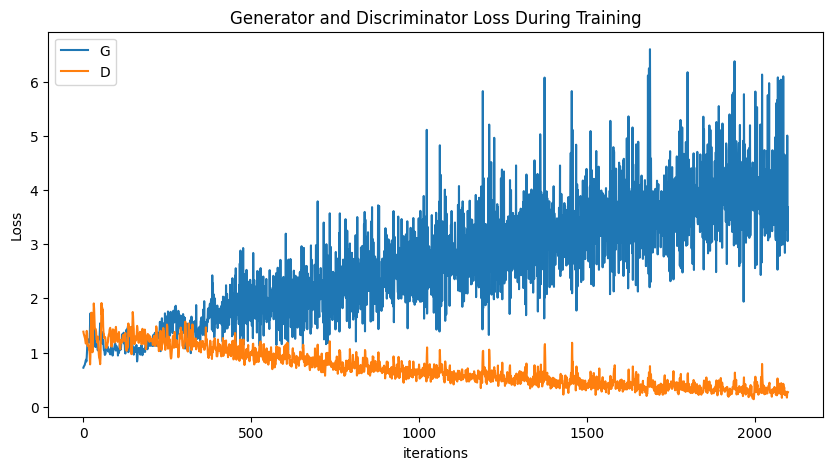

In [ ]:
#With 256x256 images
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

We can also generate a video with some images generated during the training to check how was the progress of our Generator. We will see that at the beginning, the images would be mostly noise, and then, they will become good images, not perfect, but at least enough to increase the accuracy of our classifier.

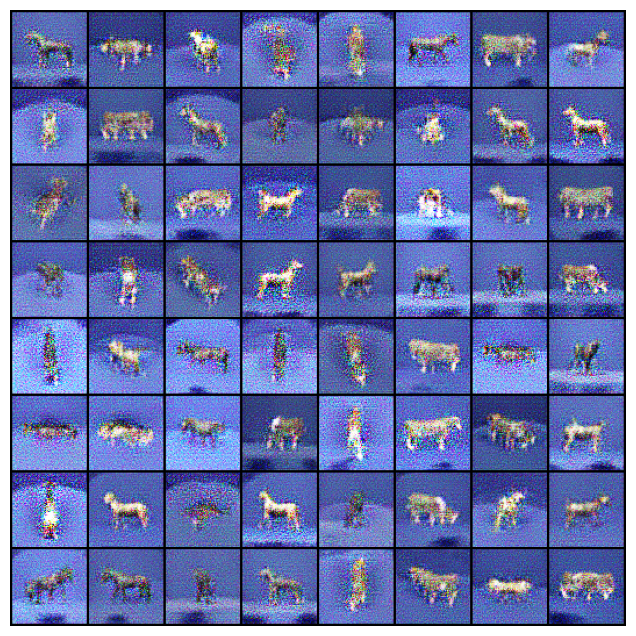

In [ ]:
#With 256x256
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

Let's generate some Fake images and show them compared with the Real images. As we can see, these images are still noisy, but they are much better than the initial latent noise.

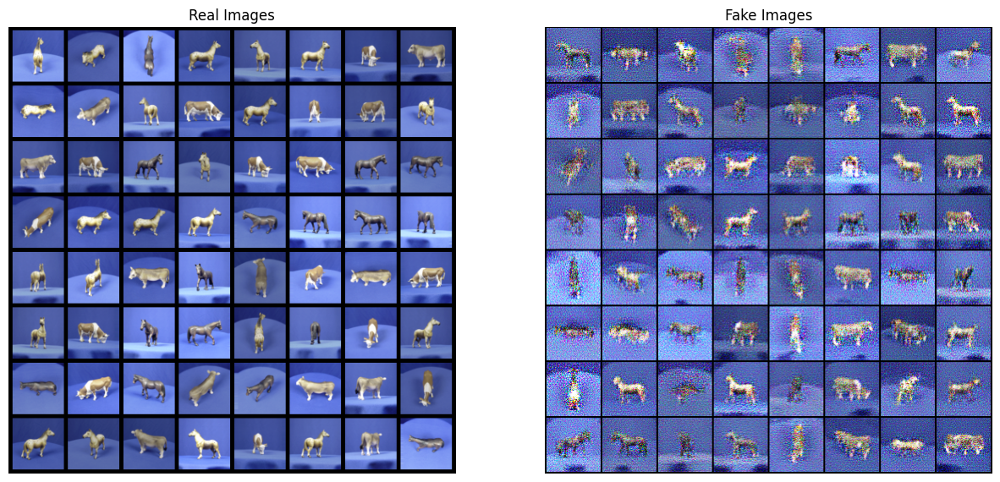

In [ ]:
#With 256x256
# Grab a batch of real images from the dataloader
real_batch = next(iter(merged_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

Let's save our models just in case we are desconected from this session, so we can just reload them and continue with the training or we can just use the Generator to create more images.

In [ ]:
#With 256x256
PATH_MODELS= directory+'/Models'
torch.save(generator.state_dict(), PATH_MODELS+'/Generator/generator_conditional_final.pt')
torch.save(discriminator.state_dict(), PATH_MODELS+'/Discriminator/discriminator_conditional_final.pt')

The following peaces of code are optional, they are showed just in case we need to reload our already trained models to avoid training it again.

In [ ]:
# Create the Discriminator
PATH_MODELS= directory+'/Models'
discriminator= Discriminator(ngpu).to(device)
#Loading the discriminator state
discriminator.load_state_dict(torch.load(PATH_MODELS+'/Discriminator/discriminator_conditional_final.pt'))

<All keys matched successfully>

In [ ]:
# Create the Generator
generator= Generator(ngpu).to(device)
#Loading the generator state
generator.load_state_dict(torch.load(PATH_MODELS+'/Generator/generator_conditional_final.pt'))


<All keys matched successfully>

Finally, to finish our Conditional GAN, let's generate 1000 images per each class (Cows and Horses) and save them into our Google Drive account, so our first Classifier model can increase its accuracy by using these new generated images.

In [ ]:
from torchvision.utils import save_image
#Let's generate and save 1000 images
fixed_noise = torch.randn(1000, nz, device=device)
fixed_labels= torch.randint(0, n_classes, (1000,), device=device)
fake = generator((fixed_noise, fixed_labels)).detach().cpu()
fake = (fake + 1) / 2

# Save each generated image
for i in range(fake.shape[0]):
    image = fake[i]  # Extract the i-th generated image
    class_name= classes[fixed_labels[i].item()]
    # Save the image using torchvision's save_image function
    save_image(image, directory+ f"/GeneratedImagesConditional/{class_name}/fake_image_{i}.png")

We can show them in the following code.

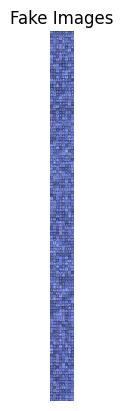

In [ ]:
fake = generator((fixed_noise, fixed_labels)).detach().cpu()
fake_list= []
fake_list.append(vutils.make_grid(fake, padding=2, normalize=True))
# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(fake_list[-1],(1,2,0)))
plt.show()

### **I.3. Enhacing our Classifier**

Now it's the time, we have already created our Generated images and we stored them in our Google Drive account in the folder **GeneratedImagesConditional**, so let's enhance our Classifier.

#### Redefining our Classifier Model

Let's redefine again our Classifier model as we did in the first part. We are using the same layers and architecture, so it's not necessary to explain again our model.

In [ ]:
#PYTORCH MODEL
class ClassifierModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=(3,3), stride=1, padding=1)
        self.act1 = nn.ReLU()
        self.drop1 = nn.Dropout(0.3)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=(3,3), stride=1, padding=1)
        self.act2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=(2, 2))

        self.conv3 = nn.Conv2d(64, 64, kernel_size=(3,3), stride=1, padding=1)
        self.act3 = nn.ReLU()
        self.pool3 = nn.MaxPool2d(kernel_size=(2, 2))

        self.flat = nn.Flatten()

        self.fc4 = nn.Linear(16384, 256)
        self.act4 = nn.ReLU()
        self.drop4 = nn.Dropout(0.5)

        self.fc5 = nn.Linear(256, 2)

    def forward(self, x):
        # input 3x64x64, output 32x64x64
        x = self.act1(self.conv1(x))
        x = self.drop1(x)
        # input 32x64x64, output 32x64x64
        x = self.act2(self.conv2(x))
        # input 32x64x64, output 32x32x32
        x = self.pool2(x)
        # input 32x32x32, output 64x32x32
        x = self.act3(self.conv3(x))
        # input 64x32x32, output 64x16x16
        x = self.pool3(x)
        # input 64x16x16, output 16384
        x = self.flat(x)
        # input 16384, output 256
        x = self.act4(self.fc4(x))
        x = self.drop4(x)
        # input 256, output 2
        x = self.fc5(x)
        return x


In [ ]:
model = ClassifierModel()
# Print the model
print(model)

ClassifierModel(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act1): ReLU()
  (drop1): Dropout(p=0.3, inplace=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act2): ReLU()
  (pool2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (act3): ReLU()
  (pool3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (fc4): Linear(in_features=16384, out_features=256, bias=True)
  (act4): ReLU()
  (drop4): Dropout(p=0.5, inplace=False)
  (fc5): Linear(in_features=256, out_features=2, bias=True)
)


#### Redefining the Loss function

As we did in the first section, let's use the Cross Entropy Loss function for our Classifier. The optimizer is an Adam optimizer with learning rate=0.001.


In [ ]:
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

#### Loading and merging our dataset

This is the most important step in our new Training of our Classifier. We are going to perform **Data augmentation** by using the Generated images. So, let's load again the Train and Test dataset. However, this time we are loading also the Generated images stored in **GeneratedImagesConditional**. Let's merge these datasets by using the ConcatDataset function. Then we can create our **merge_loader** which is the DataLoader for our merged dataset.

In [ ]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
batch_size = 64
transform= transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(64),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                               ])
train_data= dset.ImageFolder(root= train_path, transform=transform)
trainloader= torch.utils.data.DataLoader(train_data, shuffle=True, batch_size=batch_size)

test_data= dset.ImageFolder(root=test_path, transform=transform)
testloader= torch.utils.data.DataLoader(test_data, shuffle=True, batch_size=batch_size)

generated_data= dset.ImageFolder(root=directory+"/GeneratedImagesConditional", transform=transform)
generatedloader= torch.utils.data.DataLoader(generated_data, shuffle=True, batch_size=batch_size)

classes= os.listdir(train_path)
image_sample= train_data[0]


#Combining both datasets
merged_dataset= torch.utils.data.ConcatDataset([train_data, generated_data])

# Create the dataloader for the merged dataset
merged_loader= torch.utils.data.DataLoader(merged_dataset, shuffle=True, batch_size=batch_size)


#### Training again the Classifier

Let's train again our Classifier. As we can see in our output, during the training the Test accuracy was finally increasing and it reached an accuracy of 98.7%.

In [ ]:
n_epochs = 10
train_losses = []
test_losses = []
train_acc = []
test_acc = []
iters = 0
for epoch in range(n_epochs):
    acc_train = 0
    train_loss= 0
    count_train = 0
    for inputs, labels in merged_loader:
        # forward, backward, and then weight update
        y_pred = model(inputs)
        acc_train += (torch.argmax(y_pred, 1) == labels).float().sum()
        count_train += len(labels)
        loss = loss_fn(y_pred, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss+=loss
        train_losses.append(loss.item())
        train_acc.append((torch.argmax(y_pred, 1) == labels).float().sum())
        iters+=1
    acc_train /= count_train
    train_loss /= count_train


    acc_test = 0
    test_loss= 0
    count_test = 0
    for inputs, labels in testloader:
        y_pred = model(inputs)
        acc_test += (torch.argmax(y_pred, 1) == labels).float().sum()
        count_test += len(labels)
        loss = loss_fn(y_pred, labels)
        test_loss+=loss
        test_losses.append(loss.item())
        test_acc.append((torch.argmax(y_pred, 1) == labels).float().sum())
    acc_test /= count_test
    test_loss /= count_test
    print("Epoch %d: train accuracy %.2f%% train loss %.2f%% test accuracy %.2f%% test loss %.2f%%" % (epoch, acc_train*100, train_loss*100, acc_test*100, test_loss*100))

Epoch 0: train accuracy 70.61% train loss 0.86% test accuracy 60.98% test loss 1.63%
Epoch 1: train accuracy 89.56% train loss 0.40% test accuracy 92.68% test loss 0.48%
Epoch 2: train accuracy 96.49% train loss 0.14% test accuracy 97.56% test loss 0.17%
Epoch 3: train accuracy 97.60% train loss 0.09% test accuracy 96.34% test loss 0.21%
Epoch 4: train accuracy 98.98% train loss 0.04% test accuracy 98.78% test loss 0.08%
Epoch 5: train accuracy 99.35% train loss 0.03% test accuracy 98.78% test loss 0.07%
Epoch 6: train accuracy 99.45% train loss 0.03% test accuracy 98.78% test loss 0.04%
Epoch 7: train accuracy 99.45% train loss 0.01% test accuracy 98.78% test loss 0.05%
Epoch 8: train accuracy 99.91% train loss 0.01% test accuracy 97.56% test loss 0.11%
Epoch 9: train accuracy 100.00% train loss 0.00% test accuracy 98.78% test loss 0.09%


When we plot the Losses during training, we could see that this time, both losses for Train and Test datasets decreased and those values were around 0. The plot for the test loss has less iterations because the test dataset is shorter compared to the new train dataset.

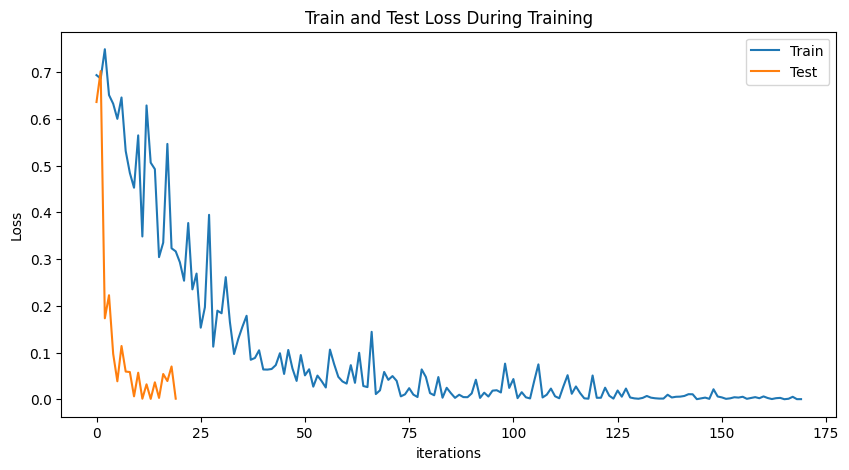

In [ ]:
#With 256x256 images
plt.figure(figsize=(10,5))
plt.title("Train and Test Loss During Training")
plt.plot(train_losses, label="Train")
plt.plot(test_losses, label="Test")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Now, if we plot our accuracies, we could see that Train and Test accuracies were high and closed to 100%. The plot for test accuracy has less iterations because the test dataset is shorter compared to the new train dataset.

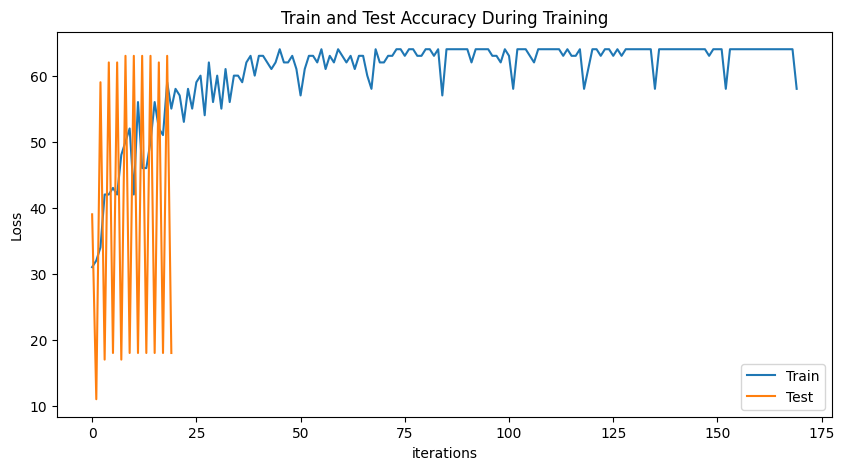

In [ ]:
#With 256x256 images
plt.figure(figsize=(10,5))
plt.title("Train and Test Accuracy During Training")
plt.plot(train_acc, label="Train")
plt.plot(test_acc, label="Test")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Let's perform a Prediction by using our trained Classifier. As we can see, now we are getting good predictions.

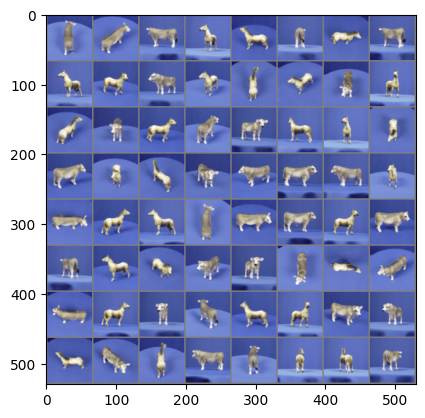

GroundTruth:  Cow   Cow   Cow   Horse
Predicted:  Cow   Cow   Cow   Horse


In [ ]:
from inspect import modulesbyfile
dataiter = iter(testloader)
images, labels = next(dataiter)
# print images
imshow(vutils.make_grid(images))
print('GroundTruth: ', ' '.join(f'{classes[labels[j]]:5s}' for j in range(4)))
outputs = model(images)
#print(outputs)
_, predicted = torch.max(outputs, 1)
print('Predicted: ', ' '.join(f'{classes[predicted[j]]:5s}'for j in range(4)))

In the same way, if we check the classification report, we can now see that “Cow” and “Horse” labels have the same precision and other metrics

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Initialize lists to store predictions and labels
all_predictions = []
all_labels = []

# Iterate through the test dataset
for images, labels in testloader:
    # Perform prediction
    outputs = model(images)
    _, predicted = torch.max(outputs, 1)

    # Store predictions and labels
    all_predictions.extend(predicted.tolist())
    all_labels.extend(labels.tolist())

# Convert lists to tensors
all_predictions = torch.tensor(all_predictions)
all_labels = torch.tensor(all_labels)

# Compute classification report
print("Classification Report:")
print(classification_report(all_labels, all_predictions, target_names=classes))

Classification Report:
              precision    recall  f1-score   support

         Cow       0.98      1.00      0.99        41
       Horse       1.00      0.98      0.99        41

    accuracy                           0.99        82
   macro avg       0.99      0.99      0.99        82
weighted avg       0.99      0.99      0.99        82



And the confusion matrix is really good. Both classes were predicted correctly in almost all the elements in the Test dataset.
And finally, plotting the confusion matrix, we can now see that almost all the predictions were True Positives which means that our classifier is now doing good classifications.

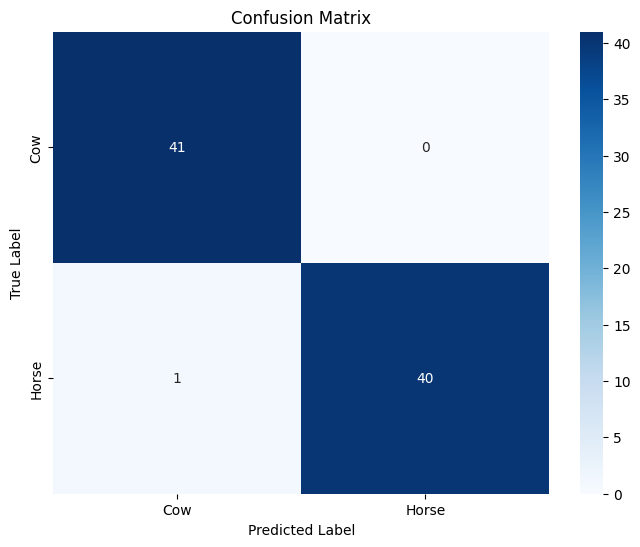

In [ ]:
# Compute confusion matrix
conf_matrix = confusion_matrix(all_labels, all_predictions)

# Visualize confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()